# Linear Regression Using Basis Function Expansion

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.datasets import make_regression
import torch
from IPython.display import Image, display

#ONLY FOR Elastic Net
import warnings
from sklearn.exceptions import ConvergenceWarning

# This is a bit of magic to make matplotlib figures appear inline in the notebook
# rather than in a new window.

%matplotlib inline
plt.rcParams['figure.figsize'] = (8.0,5.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

In [3]:
# add a column of 1s to a numpy array (for the thetas and xs)
def add_ones(a):
    return np.column_stack((np.ones(a.shape[0], ), a)) # sticks that vector as the first column of a(makes a vector of ones with the same number of rows as a)


def plot_predictions(trainX, trainy, valX, valy, theta, title, polyval=None):
    # plot the best fit model on validation set
    if polyval is not None: # assumes that polyval has a leading 1 that is qey add_ones is used for.....
        predy = np.array([ np.dot(theta,x)  for x in polyval])
    else: #Here valX has no column of 1s. So they manually add the bias term theta[0] outside the dot product:
        predy = np.array([theta[0] + np.dot(theta[1:],x)  for x in valX])

    plt.plot(trainX,trainy,'.',label = 'training set')
    plt.plot(valX,valy,'.',label = 'validation set')
    plt.plot(trainX,np.sin(trainX),'g', label = 'ground truth')
    plt.plot(valX,predy,'r', label='prediction on validation set')
    loss = sklearn.metrics.mean_squared_error(valy,predy)
    plt.title('Linear regression model; ' + 'MSE Loss on validation set = ' + str(np.round(loss,3)))
    plt.legend();

The idea here is to turn non linear data into linear data through expansion, that means, get more features out of the ones we already have. This approach represents a complex function as a sum of simpler, predefined functions (basis functions) to model non-linear relationships. Basis functions are normally selected given the nature of the data, but in some cases we can do ome tricks to expand....

Let:

* D = number of input features (e.g. $𝑥_1, 𝑥_2,…,𝑥_𝐷$)

* M = polynomial degree

Then, the number of basis functions (including all combinations of variables up to degree M) grows combinatorially, roughly like:

$\text{# of basis functions} = \frac{(M + D)!}{M! \, D!}$

That’s the number of ways to combine D variables up to degree M.

For small D and M:
* 𝐷 = 1, 𝑀=3 ⇒ 4 functions ($1, 𝑥, x^2, x^3)$
* 𝐷 = 2, 𝑀=2 ⇒ 6 functions ($1, 𝑥_1, x_2, x_1^2, x_2^2, x_1 x_2, x_2^2)$
* 𝐷=2, 𝑀=3 ⇒  10 functions ($1, x_1, x_2, x_1 x_2, x_1^2, x_2^2, x_1^3, x_2^3, x_1^2 x_2, x_1 x_2^2$)
* 𝐷=3, 𝑀=3 ⇒ 20 functions (!)

A way to choose the degree its usinf the number of inflexion points a graph has (rough idea, but descent approximate).

* degree-1 polynomial (straight line) has 0 inflections.

* degree-2 (quadratic) has one bend (U or ∩ shape).

* degree-3 (cubic) can have up to two bends.

* degree-4 (quartic) can have up to three bends.

* …and so on.



> As the degree or dimensionality grows, the number of basis terms explodes.
That’s why we often regularize or limit M in practice.



# Generate a non-linear Dataset

(629,) (629,) (100,) (100,) (100,) (100,)


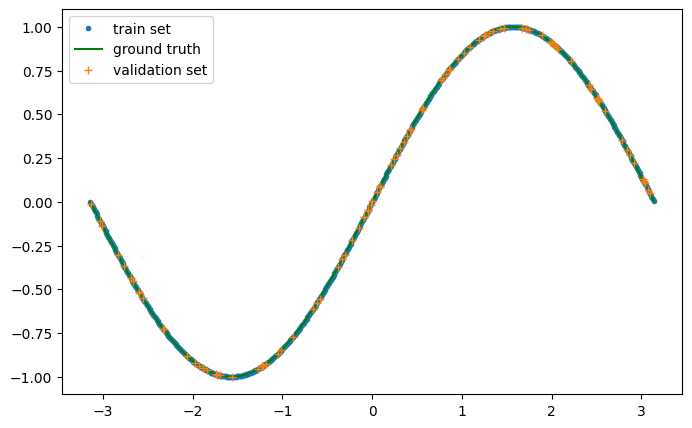

In [4]:
#GENERATE A NON LINEAR DATASET WITHOUT ERROR
trainX = np.arange(-np.pi,np.pi,0.01)  # uniformly sampled at intervals of 0.01
trainy = np.array([np.sin(x) for x in trainX]) # follow the values of the known artificial distribution y = sin(x)

valX = np.sort(np.random.uniform(-np.pi,np.pi,100)) # uniform random sampling from [-pi,pi]
valy = np.array([np.sin(x) for x in valX])

testX = np.sort(np.random.uniform(-np.pi,np.pi,100)) # uniform random sampling from [-pi,pi]
testy = np.array([np.sin(x) for x in testX])

print(trainX.shape,trainy.shape,valX.shape,valy.shape,testX.shape,testy.shape)

plt.plot(trainX,trainy,'.',label='train set')
plt.plot(trainX,np.sin(trainX),'g',label = 'ground truth')
plt.plot(valX,valy,'+',label = 'validation set')
plt.legend();

(629,) (629,) (100,) (100,) (100,) (100,)


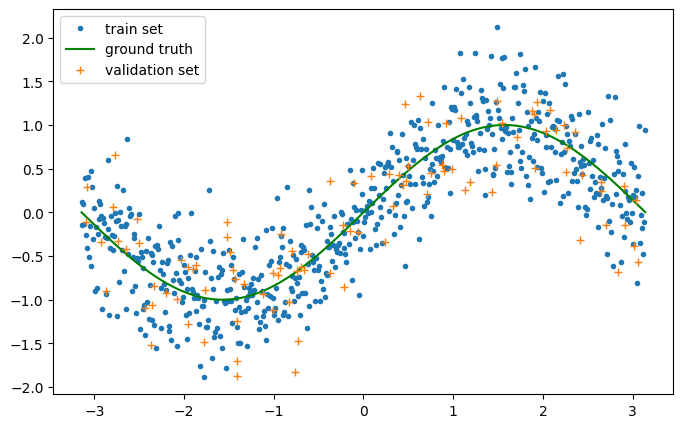

In [5]:
noise = 0.4

trainX = np.arange(-np.pi,np.pi,0.01)  # uniformly sampled at intervals of 0.01
trainy = np.array([np.sin(x) + noise*np.random.randn() for x in trainX])  # follow the values of the known artificial distribution y = sin(x) but with a normally distributed error

valX = np.sort(np.random.uniform(-np.pi,np.pi,100)) # uniform random sampling from [-pi,pi]
valy = np.array([np.sin(x) + noise*np.random.randn() for x in valX])

testX = np.sort(np.random.uniform(-np.pi,np.pi,100)) # uniform random sampling from [-pi,pi]
testy = np.array([np.sin(x) for x in testX])

print(trainX.shape,trainy.shape,valX.shape,valy.shape,testX.shape,testy.shape)

plt.plot(trainX,trainy,'.',label='train set')
plt.plot(trainX,np.sin(trainX),'g',label = 'ground truth')
plt.plot(valX,valy,'+',label = 'validation set')
plt.legend();


## Standard Linear Model - No Expansion

Theta =  [-0.00302133  0.29410849]


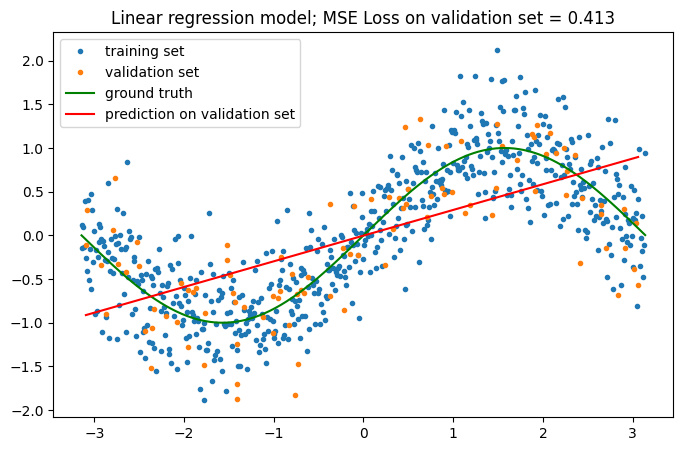

In [6]:
# build a linear model for this problem with sklearn
# find optimal model parameters using sklearn's LinearRegression

model = LinearRegression().fit(trainX.reshape(-1,1), trainy, None)
#trainX is originally a 1D array (like [x1, x2, x3, ...]).
#Scikit-learn expects X to be a 2D matrix with shape (n_samples, n_features).
#turns x data from (n_features, n_samples) / (len(x), 1) to (1, len(x))

coefs = np.hstack(((model.intercept_), model.coef_))
#model.intercept_: the bias term 0
#model.coef_: an array of slopes (01, 02, .... , 0n)


print('Theta = ',coefs)
# plot the best fit model on validation set
plot_predictions(trainX, trainy, valX, valy, coefs, 'Linear regression model ')

## Linear Model with Basis Function Expansion
Usually we first apply expansions and rescale

Sklearns has multiple ways to make expansions:
* PolynomialFeatures: Adds polynomial powers and interactions
* SplineTransformer: Adds smooth spline basis functions (piecewise polynomials)
* KBinsDiscretizer: Converts continuous variables into bins (one-hot encoded)
* FunctionTransformer: Apply any custom Python function elementwise
* OneHotEncoder: Encodes categorical variables as binary indicator columns
* LabelBinarizer/LabelEncoder: Encode labels numerically (for targets or features)

[scikit-learn.org](https://scikit-learn.org/stable/api/sklearn.preprocessing.html)

And multiple was of scaling:
* StandardScaler: Centers data (mean = 0) and scales to unit variance
* minmax_scale: Scales values to a given range (usually [0, 1])
* normalize: Scales rows to unit length (L1 or L2 norm)
* QuantileTransformer: Maps data to a uniform or normal distribution

[scikit-learn.org](https://scikit-learn.org/stable/api/sklearn.preprocessing.html)

In [7]:
# now try basis function expansion
import sklearn
from sklearn.pipeline import make_pipeline

def basis_function_expand(d, include_bias=False):
  #PolynomialFeatures just adds d exponentials.
  return make_pipeline(sklearn.preprocessing.PolynomialFeatures(degree=d, include_bias=include_bias),
                         StandardScaler())

basis_function_expand(2)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures(include_bias=False)),
                ('standardscaler', StandardScaler())])

In [8]:

expander = basis_function_expand(2, include_bias=True)
print(trainX.shape)
X_example = trainX.reshape(-1,1)
print(X_example.shape)
print(X_example[:10])
X_expanded = expander.fit_transform(X_example)
print(X_expanded.shape)
print(X_expanded[:10])

(629,)
(629, 1)
[[-3.14159265]
 [-3.13159265]
 [-3.12159265]
 [-3.11159265]
 [-3.10159265]
 [-3.09159265]
 [-3.08159265]
 [-3.07159265]
 [-3.06159265]
 [-3.05159265]]
(629, 3)
[[ 0.         -1.72929934  2.22881589]
 [ 0.         -1.72379201  2.20754308]
 [ 0.         -1.71828469  2.18633808]
 [ 0.         -1.71277737  2.16520091]
 [ 0.         -1.70727004  2.14413156]
 [ 0.         -1.70176272  2.12313003]
 [ 0.         -1.6962554   2.10219632]
 [ 0.         -1.69074808  2.08133043]
 [ 0.         -1.68524075  2.06053237]
 [ 0.         -1.67973343  2.03980212]]


## Unregularized linear regression with basis function expansion

In [9]:
# pass in X with X0 = 1 [samples, x1 + bias]
def normal_equation(X,y):
    # calculate optimal theta using (Xb.T Xb)^{-1} Xb.T y
    X = X + 1e-5 * np.eye(X.shape[0],X.shape[1])
    theta_best = np.linalg.inv(X.T @ X) @ X.T @ y
    return theta_best

Theta's new size =  (4,)


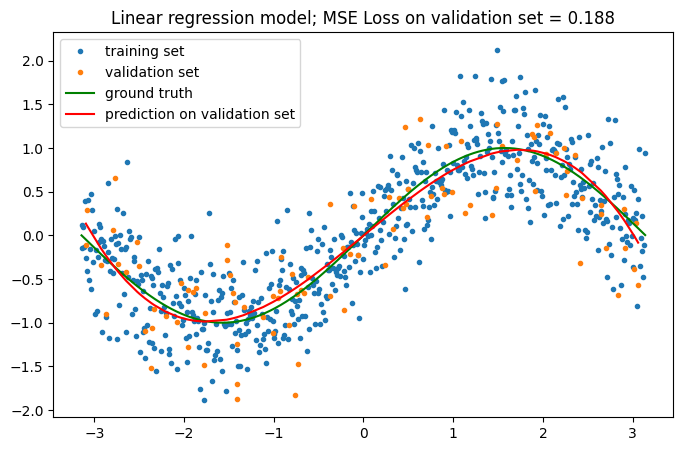

Theta's new size =  (10,)


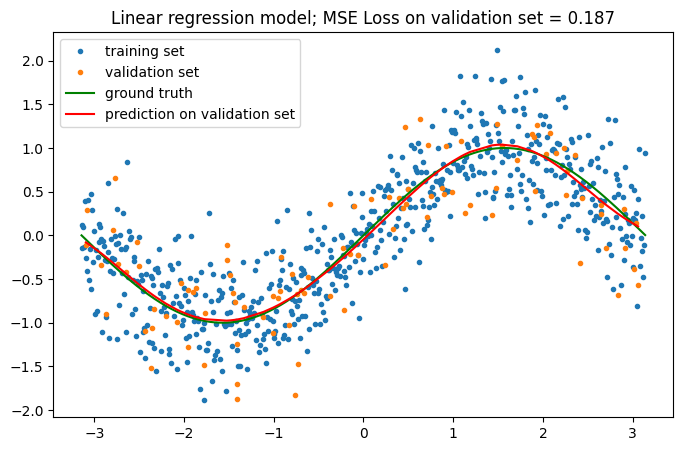

Theta's new size =  (16,)


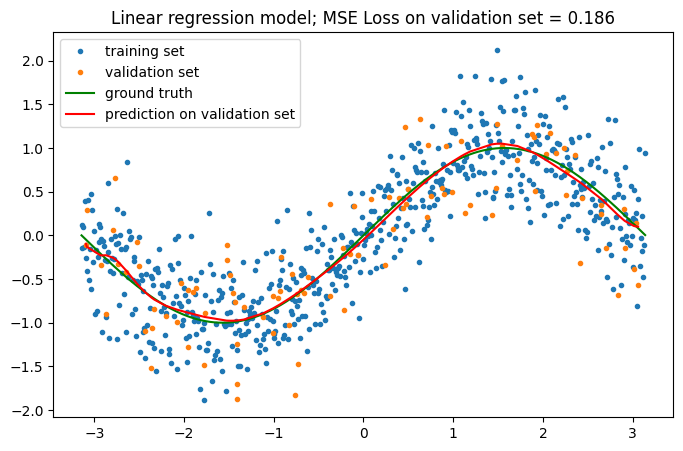

Theta's new size =  (21,)


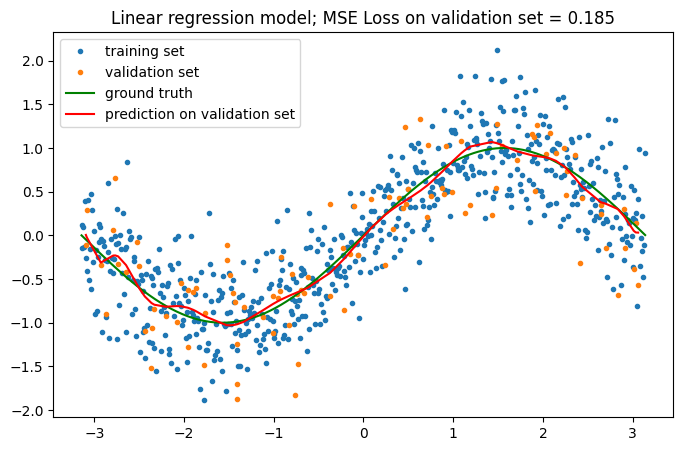

Theta's new size =  (31,)


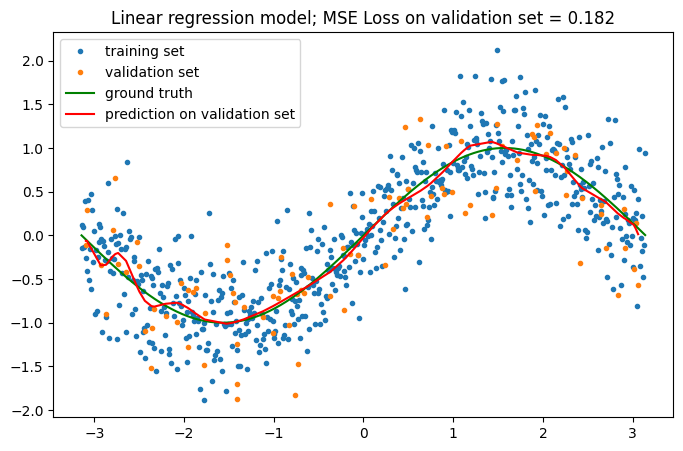

In [10]:
degrees = [3, 9, 15, 20, 30]
for degree in degrees:
  pipeline = basis_function_expand(degree) #is a transformer that turns x into [𝑥, 𝑥2, 𝑥3, xdegree], then scales them.
  polyX = pipeline.fit_transform(trainX.reshape(-1,1)) # expanded X values for train

  #The line below can be substituted by any other LR seen in the Repo, we just need to get the model's
  theta = normal_equation(add_ones(polyX), trainy) # Solve for θ with normal equation, This gives the optimal parameters for least squares (GROUND TRUTH)

  polyval = pipeline.transform(valX.reshape(-1,1)) #Expand the validation X

  print("Theta's new size = ",theta.shape)

  # predict and plot the best fit model
  plt.figure(figsize=(8, 5))
  plot_predictions(trainX, trainy, valX, valy, theta,'Linear regression model with cubic basis ',add_ones(polyval))
  plt.show()

# Explaining Regularization
Lets try to explain regularization more in detail of what is hapening mathematically with the $\theta_1 \times \theta_2 \times \text{loss}$ plane using the classical regularization image as a reference and gifs available online.

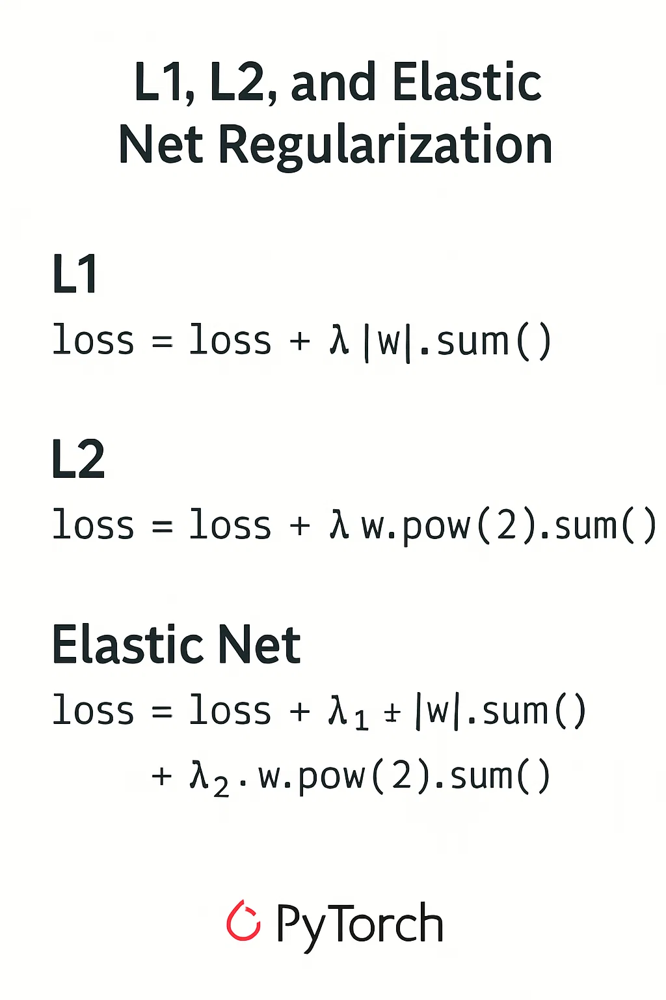

In [17]:
display(Image(filename='regs.png'))

Each regularization method defines a constraint region in parameter space, centered at the origin of the multidimensional space of model parameters $\theta$. As the regularization strength $\lambda$ increases, this constraint region becomes smaller, restricting the magnitude of the allowable parameter values. This is shown in the below gif taken from
[Regularization in Machine Learning: Part 1](https://www.mdrk.io/regularization-in-machine-learning-part1/)

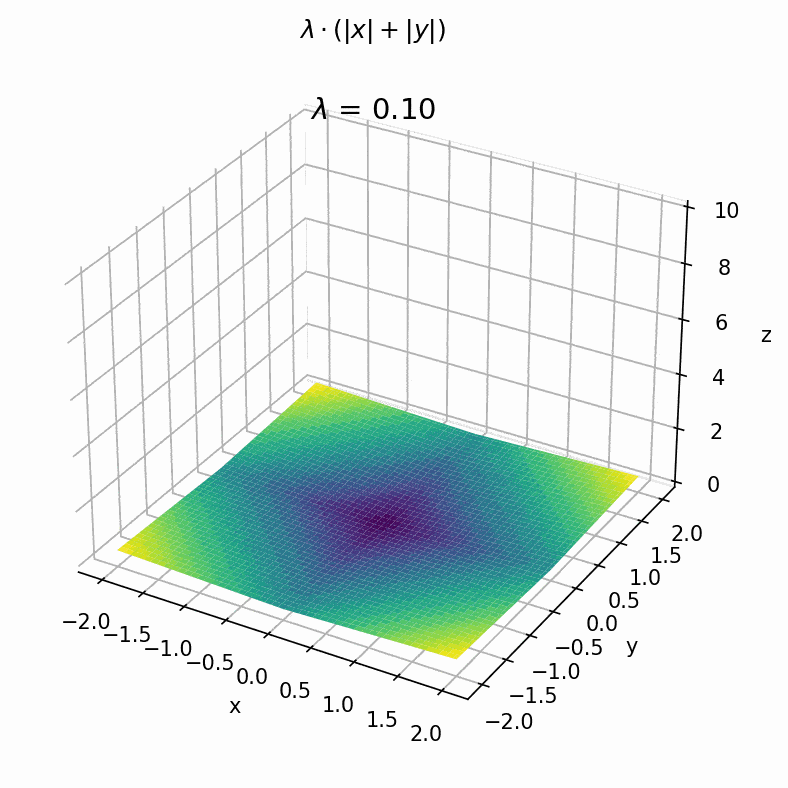

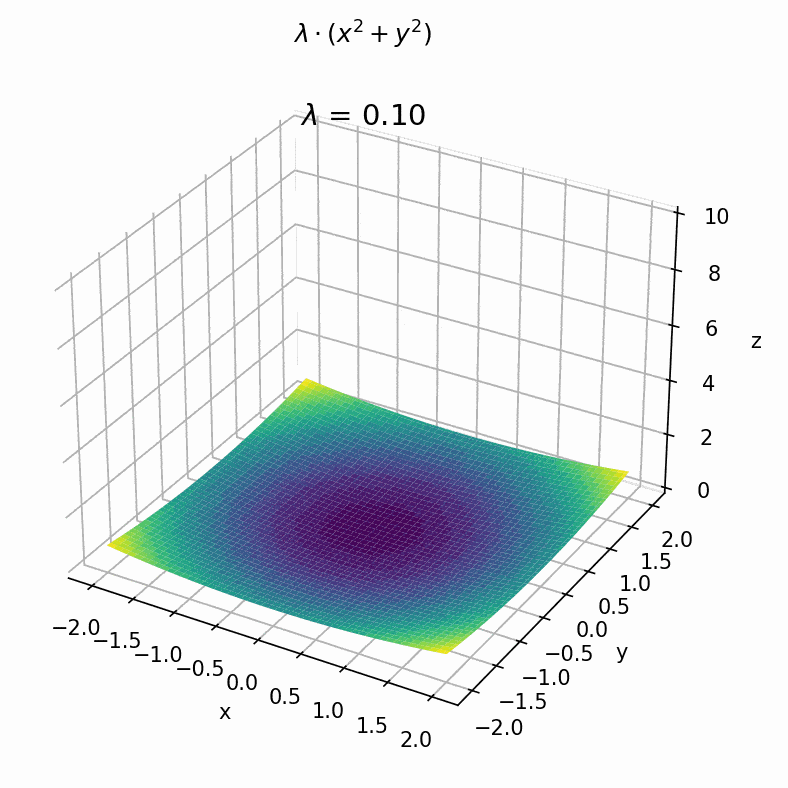

In [14]:
display(Image(filename="l1_reg.gif"))
display(Image(filename="l2_reg.gif"))


These regions become a constrain of "Where to look for the thetas that have the minimum loss, which is the origin of all dimensions." However, rather than directly constraining the optimization to remain inside this region, regularization is typically implemented through a penalized loss function, which is mathematically equivalent to the constrained formulation:

* $L2: \text{New_loss} = \text{original_loss} + \lambda(\theta_1^2 + \theta_2^2)$
* $L1: \text{New_loss} = \text{original_loss} + \lambda(|\theta_1| + |\theta_2|)$

The below image and gif taken from ["A visual explanation for regularization of linear models"](https://explained.ai/regularization/) shows the constrain region in orange/brown and the function's "original_loss" in blue and red.



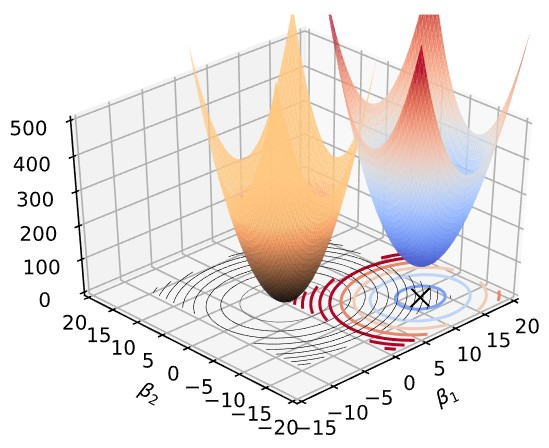

In [15]:
display(Image(filename="reg.jpg"))

Geometrically, the constraint regions correspond to a circle for L2 regularization and a diamond for L1 regularization. The original loss function defines contour lines (level sets) in parameter space. Conceptually, the solution is found by expanding these loss contours outward from the minimum of the unregularized loss until the first contour intersects the constraint region.

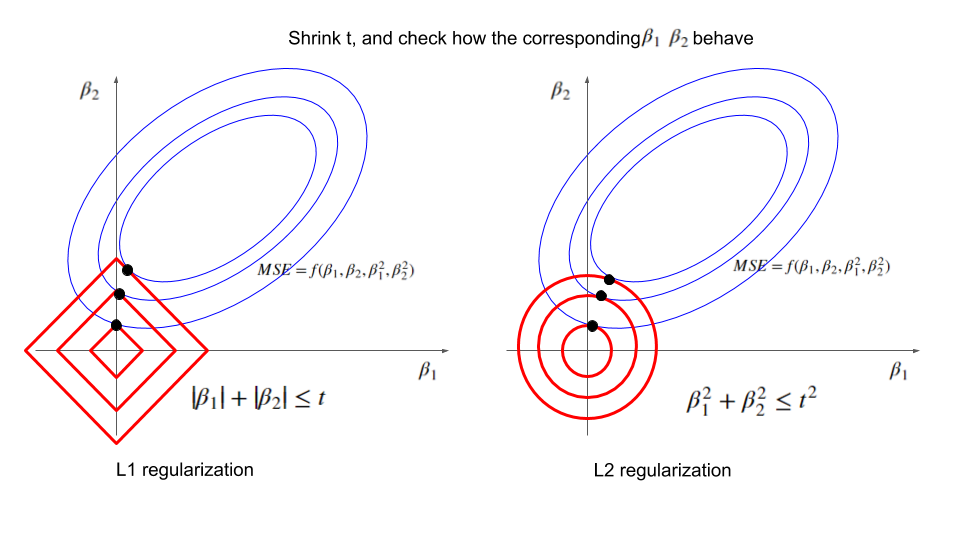

In [18]:
display(Image(filename='regs2.png'))

In the penalized view, adding regularization defines a new loss function whose minimum corresponds to the point where the lowest original-loss contour first intersects the constraint region, pulling the solution closer to the origin. Importantly, the original loss function itself does not change—only the optimization objective does.

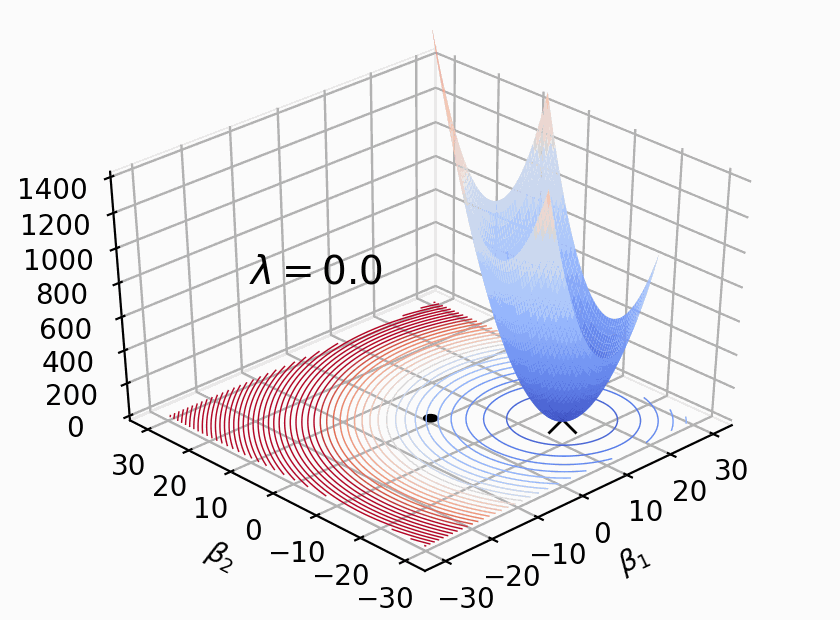

In [16]:
display(Image(filename="lagrange-animation.gif"))

L1 and L2 regularization have different but complementary properties.

* L1 regularization tends to produce sparse solutions because the corners of its constraint region are aligned with the coordinate axes. As a result, the first point of contact between a loss contour and the constraint region often occurs at a corner, where one or more parameters are exactly zero. This makes L1 useful for feature selection. **If features are correlated, L1 may pick arbitrarily. Combine with L2 (Elastic Net):**
  * Correlated features share the weight instead of arbitrarily dropping some.

    * USE A CORRELATION MATRIX TO SEE THESE COREELATIONS:
      * If you see many feature pairs with |r| ≥ 0.7–0.8, then features are highly correlated and use L2 or Elastic Net.

Using L1 alone could be unstable

Elastic Net or L2 is better to shrink correlated coefficients togethe

  * The solution tends to assign similar nonzero coefficients to all correlated predictors.

  * Stability improves — small changes in data won’t drastically change which correlated features are selected.

  

* L2 regularization, on the other hand, has a smooth, circular constraint region. Loss contours can touch the region at any point, making it unlikely for parameters to be exactly zero. Instead, L2 shrinks coefficients smoothly and evenly, which is particularly beneficial when features are collinear or codependent, as it reduces coefficient variance and improves model stability and generalization.

# Regularized linear regression (L2 penalty)


> Ridge Regression will reduce the oscillations as it reduces overfitting



Theta =  [-3.48974616e-03  1.53685116e+00 -3.20501184e-04 -1.09443174e+00]


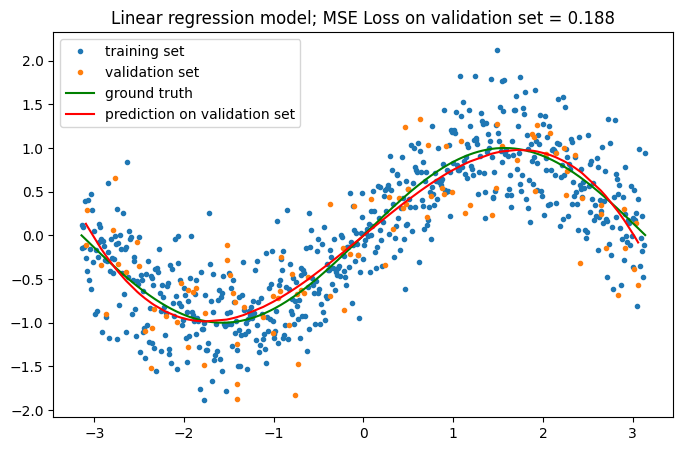

Theta =  [-3.48974616e-03  1.73932181e+00  1.58108396e-01 -1.50267084e+00
 -3.64579479e-01 -1.65325330e-01  2.12121426e-01  4.17416983e-01
  1.50844386e-03 -5.49239139e-03]


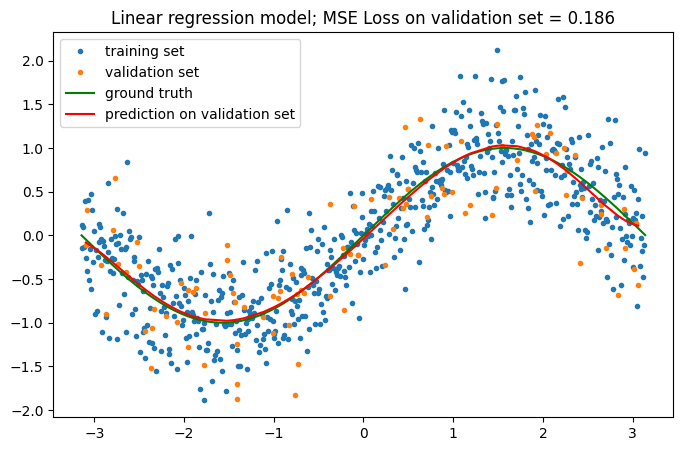

Theta =  [-0.00348975  1.72525047  0.17207584 -1.39889967 -0.39627065 -0.29958587
  0.14284232  0.22989994  0.18879049  0.24737343 -0.02553901  0.12287563
 -0.13856964 -0.00677509  0.06333216 -0.13943388]


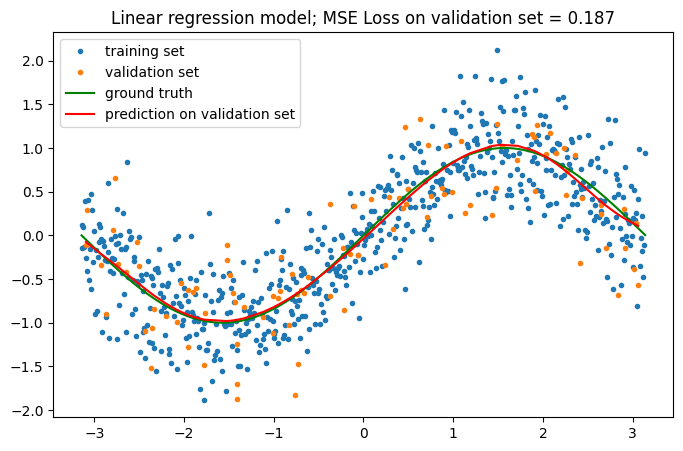

Theta =  [-0.00348975  1.72443349  0.20219465 -1.40302603 -0.48775903 -0.2704408
  0.07926423  0.220754    0.33428175  0.20224038  0.21387243  0.08476973
 -0.05307064  0.01475243 -0.26707283 -0.01061744 -0.30025866 -0.02660743
 -0.08992232 -0.0558477   0.37811994]


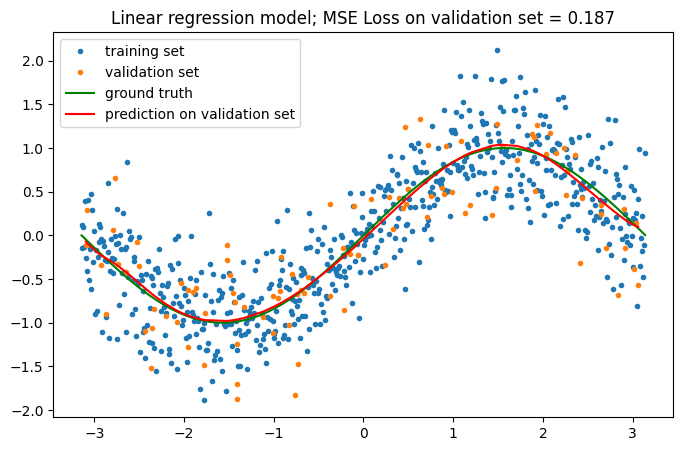

Theta =  [-3.48974616e-03  1.72441217e+00  1.97000041e-01 -1.40491734e+00
 -3.80120407e-01 -2.63506304e-01 -1.00152610e-01  2.21671517e-01
  1.62465629e-01  1.94123337e-01  2.51576865e-01  7.29076926e-02
  2.00576519e-01  7.37202242e-03  7.38132698e-02 -5.20002835e-03
 -6.63769684e-02 -1.09778805e-03 -1.74592450e-01 -4.23661123e-03
 -2.26156804e-01 -1.91040425e-02 -2.13820685e-01 -3.65508060e-02
 -1.41971771e-01 -4.10938198e-02 -2.11636825e-02 -1.62636206e-02
  1.35952860e-01  5.23532499e-02  3.17195706e-01]


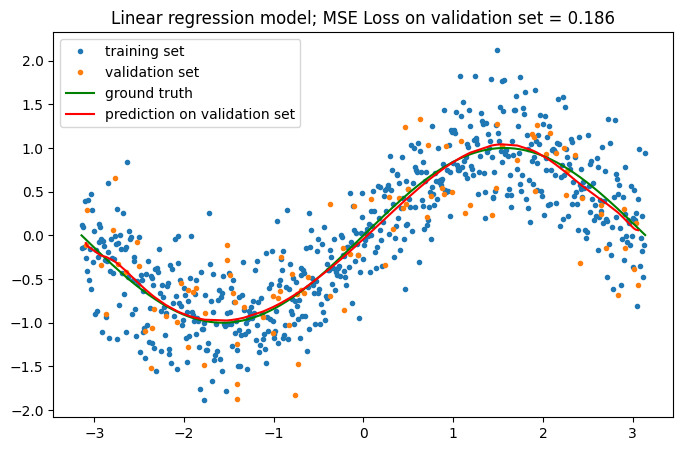

In [20]:
degrees = [3, 9, 15, 20, 30]
for degree in degrees:
  pipeline = basis_function_expand(degree) #is a transformer that turns x into [𝑥, 𝑥2, 𝑥3, xdegree], then scales them.
  polyX = pipeline.fit_transform(trainX.reshape(-1,1)) # expanded X values for train

  model = Ridge(alpha=0.1).fit(polyX, trainy)
  polyval = pipeline.transform(valX.reshape(-1,1)) #Expand the validation X
  coefs = np.hstack(((model.intercept_), model.coef_))

  print('Theta = ', coefs)

  # predict and plot the best fit model
  plt.figure(figsize=(8, 5))
  plot_predictions(trainX,trainy,valX,valy,coefs,'Regularized Linear regression model with cubic bases ',add_ones(polyval))
  plt.show()

### Tuning $\lambda2$ Regularization using Validation Set

In [23]:
def finetune_lambda(degree, lambdas, trainX, trainy, valX, valy, model):
  """
  Return the best lambda from the list of lambdas, limbda can soemtimes be called alpha.
  INPUTS:
    degree → degree of polynomial expansion (e.g., 3 for cubic).
    alphas → list/array of candidate λ values to try.
    trainX, trainy → training data.
    valX, valy → validation data.
    model → the regression model (e.g., Ridge()).
  """
  losses = []
  best_loss = np.inf

  pipeline = basis_function_expand(degree)
  polyX = pipeline.fit_transform(trainX.reshape(-1,1)) #polyX = expanded training features.
  polyval = pipeline.transform(valX.reshape(-1,1)) #polyval = expanded validation features.

  for alpha in lambdas:
    model.set_params(alpha=alpha) #Set the model’s α (regularization strength).
    model.fit(polyX,trainy) # Train (fit) on expanded training data.
    yval_pred = model.predict(polyval) # Predict on validation data.
    loss = sklearn.metrics.mean_squared_error(valy, yval_pred) # Compute validation MSE.
    losses.append(loss) #store losses
    if loss < best_loss: #Update best loss so far
      best_loss = loss
      best_alpha = alpha
  return best_alpha

In [26]:
lambdas = [1e-3,1e-2,1e-1,1.0,10]
degree = 3
model = Ridge()
best_lambda = finetune_lambda(degree,lambdas,trainX,trainy,valX,valy,model)
print(f'The best lambda/alpha for this model at a SplineTransformer expansion of degree {degree} is of: {best_lambda}')

The best lambda/alpha for this model at a SplineTransformer expansion of degree 3 is of: 0.001


### Tuning Degree and $\lambda2$ Regularization using Validation Set

In [27]:
#Smae as above we only tune the degree through a loop to initialize the extension using said degree and said alpha
def finetune_degree_lambda(degrees,alphas,trainX,trainy,valX,valy,model):

    best_loss = np.inf
    losses = []
    for degree in degrees:
        pipeline = basis_function_expand(degree)
        polyX = pipeline.fit_transform(trainX.reshape(-1,1))
        polyval = pipeline.transform(valX.reshape(-1,1))

        for alpha in alphas:
            model.set_params(alpha=alpha,max_iter=100000)
            model.fit(polyX,trainy)
            yval_pred = model.predict(polyval)
            loss = sklearn.metrics.mean_squared_error(valy,yval_pred)
            if loss < best_loss:
                best_loss = loss
                best_alpha = alpha
                best_degree = degree
            losses.append(loss)

    return best_degree, best_alpha, best_loss


In [28]:
lambdas = [1e-4,1e-3,1e-2,1e-1,1.0,1e1]
degrees = np.arange(3,15,1)
model = Ridge()
best_degree, best_lambda, best_loss = finetune_degree_lambda(degrees,lambdas,trainX,trainy,valX,valy,model)
print('Best degree = ', best_degree, ' Best lambda = ', best_lambda)

Best degree =  12  Best alpha =  1.0


#### Building best L2 model

Theta =  [-0.00348975  1.75753477  0.30469241 -1.47981007 -1.03642603 -0.52926404
  0.7419368   1.06104855  1.46819635 -0.31591308 -2.60381413 -0.0107863
  1.13468454]


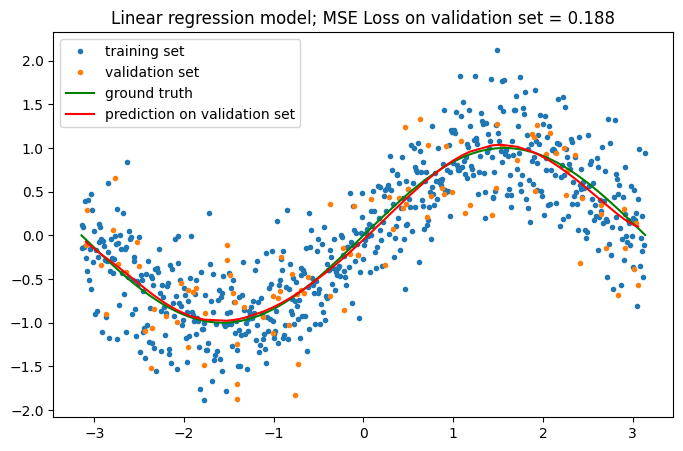

In [29]:
pipeline = basis_function_expand(best_degree)
polyX = pipeline.fit_transform(trainX.reshape(-1,1))
polyval = pipeline.transform(valX.reshape(-1,1))
model = Ridge(alpha=best_lambda).fit(polyX,trainy)

coefs = np.hstack(((model.intercept_), model.coef_))
print('Theta = ', coefs)

# plot the best fit model
plot_predictions(trainX,trainy,valX,valy,coefs,'Best Regularized Linear regression model with optimized bases ',add_ones(polyval))


# Regularized linear regression (L1 penalty)

Theta =  [-0.00348975  1.41923913 -0.         -0.97681144]


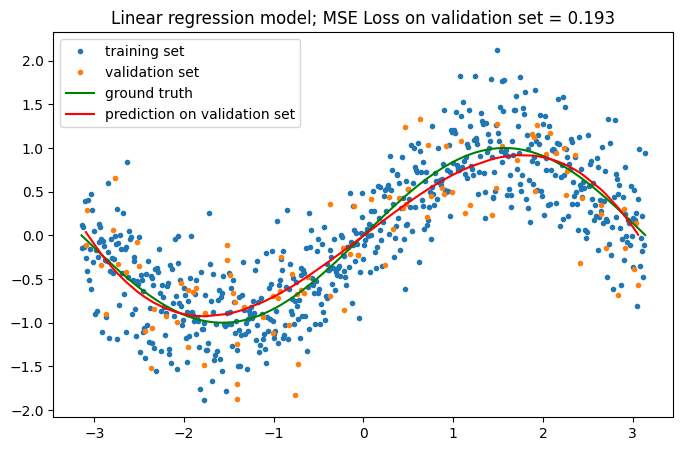

In [30]:
# find optimal model parameters using sklearn's LinearRegression

degree = 3   # vary this between 3 - 30 and see how the fit and coefficients change

pipeline = basis_function_expand(degree)
polyX = pipeline.fit_transform(trainX.reshape(-1,1))
polyval = pipeline.transform(valX.reshape(-1,1))
model = Lasso(alpha=0.01).fit(polyX,trainy)


coefs = np.hstack(((model.intercept_), model.coef_))
print('Theta = ', coefs)


# plot the best fit model
plot_predictions(trainX,trainy,valX,valy,coefs,'Regularized L1 regression model with cubic basis ',add_ones(polyval))

In [31]:
lambdas = [1e-4,1e-3,1e-2,1e-1,1.0,1e1]
degrees = np.arange(3,33,1)
model = Lasso()
best_degree, best_lambda, losses = finetune_degree_lambda(degrees,lambdas,trainX,trainy,valX,valy,model)
print('Best degree = ', best_degree, ' Best lambda/alpha = ', best_lambda)

Best degree =  26  Best alpha =  0.001


Theta =  [-0.00348975  1.68309582  0.02392268 -1.39305401 -0.01701344 -0.
 -0.01944266  0.         -0.          0.0976275  -0.          0.0956325
 -0.          0.         -0.          0.         -0.          0.
  0.         -0.          0.         -0.          0.         -0.
  0.         -0.00307511  0.01576901]


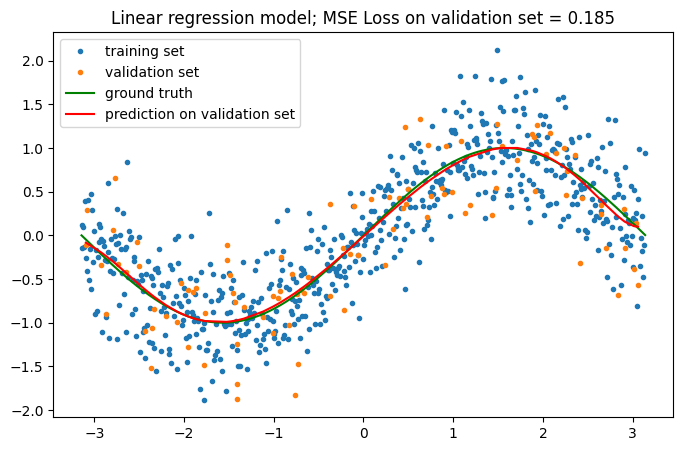

In [33]:
pipeline = basis_function_expand(best_degree)
polyX = pipeline.fit_transform(trainX.reshape(-1,1))
polyval = pipeline.transform(valX.reshape(-1,1))
model = Lasso(alpha=best_lambda).fit(polyX,trainy)


coefs = np.hstack(((model.intercept_), model.coef_))
print('Theta = ', coefs)


# plot the best fit model
plot_predictions(trainX,trainy,valX,valy,coefs,'Regularized L1 regression model with optimized basis ',add_ones(polyval))

# Regularized linear regression (L1 + L2 penalty, AKA Elastic Net)

In [50]:
def finetune_degree_lambda_elasticnet(degrees, alphas, l1_ratios, trainX, trainy, valX, valy):
    best_loss = np.inf
    losses = []
    for degree in degrees:
        for alpha in alphas:
            for l1_ratio in l1_ratios:
                pipeline = basis_function_expand(degree)
                polyX_train = pipeline.fit_transform(trainX.reshape(-1,1))
                polyX_val = pipeline.transform(valX.reshape(-1,1))

                #Sclaer is usually needed but its got added to ensure covergence as Elastic Net takes longer to converge.
                scaler = StandardScaler()
                polyX_train_scaled = scaler.fit_transform(polyX_train)
                polyX_val_scaled = scaler.transform(polyX_val)

                model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_iter=50000)
                model.fit(polyX_train, trainy)
                coefs = np.hstack(((model.intercept_), model.coef_))

                yval_pred = model.predict(polyX_val)
                loss = sklearn.metrics.mean_squared_error(valy,yval_pred)

                if loss < best_loss:
                    best_loss = loss
                    best_degree = degree
                    best_alpha = alpha
                    best_L1_ratio = l1_ratio

                losses.append(loss)

    return best_degree, best_alpha, best_L1_ratio, best_loss, coefs

In [51]:
warnings.filterwarnings('ignore', category=ConvergenceWarning)
lambdas = [1e-4,1e-3,1e-2,1e-1,1.0,1e1]
degrees = np.arange(3,33,1)
l1_ratios = [0.1, 0.3, 0.5, 0.7, 0.9]
best_degree, best_lambda, best_L1_ratio, best_loss, coefs = finetune_degree_lambda_elasticnet(degrees, lambdas, l1_ratios, trainX,trainy, valX,valy)
print('Best degree = ', best_degree, ' Best lambda/alpha = ', best_lambda, 'Best L1 Ratio = ', best_L1_ratio)
warnings.filterwarnings('default', category=ConvergenceWarning)

Best degree =  20  Best lambda/alpha =  0.001 Best L1 Ratio =  0.5


Theta (on scaled features) =  [-0.00348975  1.67834144  0.05337808 -1.38581671 -0.06986961 -0.
 -0.          0.         -0.          0.08790637  0.          0.10332272
  0.          0.          0.          0.          0.         -0.
  0.         -0.00360331  0.02105121]
0.1851479927619233


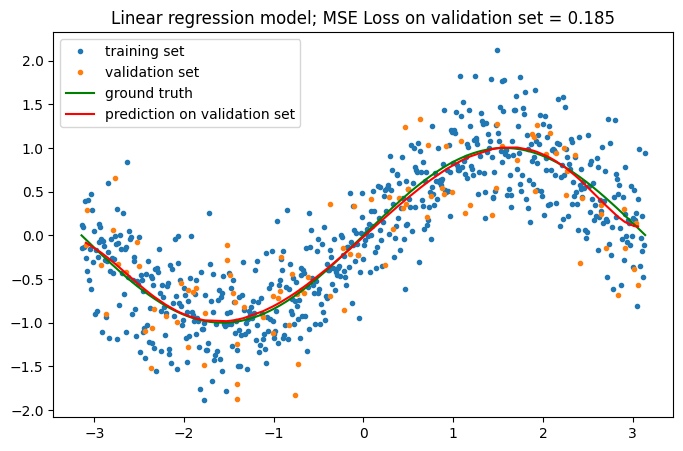

In [57]:
pipeline = basis_function_expand(best_degree)
polyX = pipeline.fit_transform(trainX.reshape(-1,1))
polyval = pipeline.transform(valX.reshape(-1,1))
scaler = StandardScaler()
polyX_scaled = scaler.fit_transform(polyX)
polyval_scaled = scaler.transform(polyval)
model = ElasticNet(alpha=best_lambda, l1_ratio=best_L1_ratio, max_iter=10000).fit(polyX_scaled, trainy)

coefs = np.hstack(((model.intercept_), model.coef_))
print('Theta (on scaled features) = ', coefs)
plot_predictions(trainX, trainy, valX, valy, coefs,
                f'ElasticNet (α={best_lambda}, l1_ratio={best_L1_ratio})',
                add_ones(polyval_scaled))  # Use scaled features
print(best_loss)